---
title: "12. Machine listening"
subtitle: "Feature extraction, music information retrieval, and artificial intelligence"
---

This week is about *machine listening*: how sound becomes structured information that a computer can work with. It works entirely within the *digital representation* of the [four levels of description](#levels-of-description), and the most useful question to carry through the chapter is how far up the remaining levels a machine can be pushed from there. It sits where music perception, signal processing, and machine learning meet. We follow the whole signal→symbol pipeline: capturing audio and cleaning it up, extracting features (spectral, timbral, harmonic, temporal), finding segments and events, and classifying and modelling how sound changes over time. Machine listening is the foundation for the more focused field of *music information retrieval* (MIR) and for today's musical AI.

## What machine listening is

Machine listening, sometimes called [computer audition](https://en.wikipedia.org/wiki/Computer_audition), is the practice of turning sound—music, speech, or environmental audio—into structured, usable information. It builds on digital signal processing, but with a particular focus: capturing reliable audio, extracting features that reflect how we perceive sound, detecting events and boundaries, mapping patterns to labels, modelling how sound evolves over time, combining cues into higher-level interpretations, and presenting the results in a form people or other systems can use. {cite:t}`Muller2021FMP` and {cite:t}`Lerch2022` are the two standard textbook treatments of this pipeline.

The examples below use Python code with the librosa audio library, written as a Jupyter Notebook. You are not expected to learn these for this course, but it helps to know what they are:

<details>
<summary>Python programming language</summary>

[Python](https://www.python.org/) is a high-level programming language widely used for scientific computing, data analysis, and machine learning. It is based on loading various libraries that extend functionality, including general scientific computing libraries ([NumPy](https://numpy.org/), [SciPy](https://scipy.org/), [pandas](https://pandas.pydata.org/)), specific audio libraries ([librosa](https://librosa.org/), [Essentia](https://essentia.upf.edu/), [madmom](https://github.com/CPJKU/madmom)), and machine learning libraries ([PyTorch](https://pytorch.org/), [TensorFlow](https://www.tensorflow.org/)). Its clean syntax makes it relatively quick to learn and it can be deployed on many systems.
</details>

<details>
<summary>Jupyter Notebooks</summary>

A [Jupyter Notebook](https://jupyter.org/) is an interactive, web-based environment for creating and sharing documents that combine live code, rich text, visualisations, and results. Code is organised into executable cells with outputs shown inline, enabling iterative experimentation, data exploration, and reproducible workflows. Notebooks support multiple kernels (Python, R, Julia), rich media, and easy export to formats like HTML and PDF. This book is also written as a Jupyter Notebook.
</details>

<details>
<summary>Librosa audio library for Python</summary>

In the following, we will explore some of the functionality of [librosa](https://librosa.org/) {cite:p}`McFee2015Librosa`, a general-purpose, high-level Python library for audio / music analysis (easy prototyping, ML features).
</details>

:::{note} Going deeper: working reproducibly
:class: dropdown
When you run notebooks or scripts yourself (or hand in project work), a few habits make results easier to repeat and to explain: keep a [conda](https://docs.conda.io/) or [venv](https://docs.python.org/3/library/venv.html) environment (or a `requirements.txt` / lockfile) with package versions; note your Python and operating-system versions; fix random seeds wherever randomness affects outputs (for example in machine-learning demos); and centralise preprocessing steps (resampling, normalisation, trimming) so the path from raw file to feature is traceable. When you use audio files or corpora, check the licence and attribution (for example Creative Commons terms on [Freesound](https://freesound.org/)) so sharing and redistribution stay legal and ethical.
:::

### Audio input and preprocessing

Whether audio arrives from microphones, interfaces, or files, reliable analysis begins with some basic [digital signal processing](https://en.wikipedia.org/wiki/Digital_signal_processing): resampling, DC removal, level normalisation, denoising, and de-clicking. These steps raise the signal-to-noise ratio, remove systematic artefacts such as low-frequency hum, and make features comparable across recordings, so the later stages behave predictably.

Once the audio is cleaned up, it can be the source for further analysis. A machine does not need to visualise sound to interpret it, but for the examples that follow, it helps to remember that the machine also starts with a waveform. As we have seen in earlier weeks, one of the basic ways to begin any audio analysis is to convert from the temporal domain (the waveform) to the spectral domain (for example, creating a spectrogram using FFT). The running example through this chapter is the excerpt of John Coltrane's *My Favorite Things* that you met in [time and rhythm](time-and-rhythm.ipynb). 

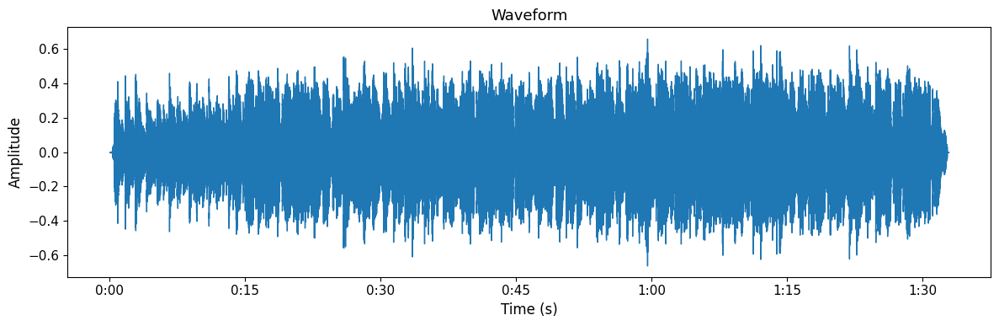

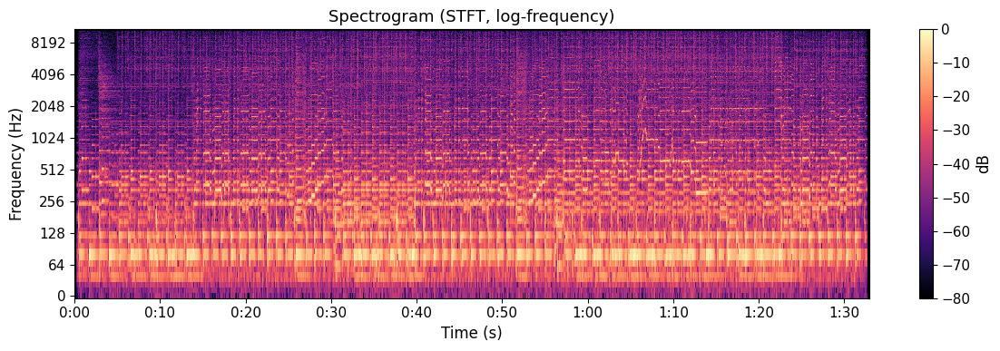

In [1]:
import librosa
from IPython.display import Audio, display
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams.update({
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "figure.figsize": (10, 4),
    "figure.dpi": 100,
    "savefig.dpi": 150,
    "axes.spines.top": False,
    "axes.spines.right": False,
})

audio_path = "audio/week6_audio_ex_2_coltrane_myfavthings.mp3"
y, sr = librosa.load(audio_path, sr=22050, mono=True)

hop_length = 512

# Waveform (separate figure)
plt.figure(figsize=(10, 3.3))
try:
    librosa.display.waveshow(y, sr=sr)
except AttributeError:
    librosa.display.waveplot(y, sr=sr)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()

# show a playbar for the loaded audio below the spectrogram
display(Audio(audio_path))

# Spectrogram (STFT -> dB) (separate figure)
plt.figure(figsize=(10, 3.3))
S = np.abs(librosa.stft(y, n_fft=2048, hop_length=hop_length))
S_db = librosa.amplitude_to_db(S, ref=np.max)
librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='magma')
plt.title('Spectrogram (STFT, log-frequency)')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.colorbar(label='dB')
plt.tight_layout()
plt.show()


### Feature extraction

*Feature extraction* converts raw audio (waveforms or spectrograms) into compact descriptors that better reflect perceptual and musical structure. Features are commonly grouped by abstraction level:

- **Low-level descriptors** are useful for timbre and energy tracking. They are typically short-term and include features such as spectral centroid (the spectrum's centre of gravity, heard as brightness), bandwidth, rolloff, spectral flatness, RMS, and zero-crossing rate.
- **Mid-level descriptors** are useful for key, chord, and melodic analysis. They focus on harmonic/tonal relationships and include chromagram, constant-Q transforms (CQT), F0/pitch contours, and harmonic-percussive decomposition.
- **High-level descriptors** are useful for rhythm and structure analysis. They include temporal developments such as onset strength, tempogram, beat tracking, and segment boundaries.

The names are worth skimming rather than memorising: each is a single number or curve computed from the audio, and the ones used later in this chapter are explained where they appear. Some of these work in the temporal domain (waveforms), others in the spectral domain (spectrograms), and some combine both. Extracting musical features from audio is not straightforward. As an example, let us look at a [chromagram](https://en.wikipedia.org/wiki/Chroma_feature), which estimates the pitch classes in a recording (the same twelvefold reduction used analytically in [harmony and melody](harmony-and-melody.ipynb)): 

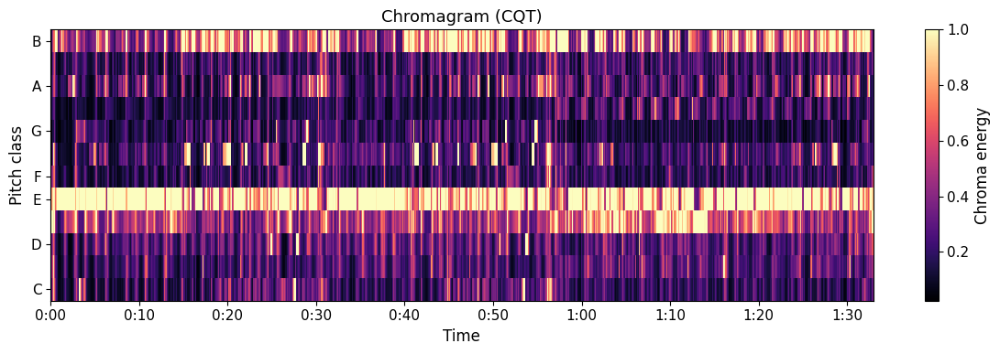

In [2]:
import matplotlib.pyplot as plt
plt.rcParams.update({
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "figure.figsize": (10, 4),
    "figure.dpi": 100,
    "savefig.dpi": 150,
    "axes.spines.top": False,
    "axes.spines.right": False,
})
# Compute chromagram (CQT-based)
chroma = librosa.feature.chroma_cqt(y=y, sr=sr, hop_length=hop_length)

plt.figure(figsize=(10, 3.3))
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', sr=sr, hop_length=hop_length, cmap='magma')
plt.colorbar(label='Chroma energy')
plt.title('Chromagram (CQT)')
plt.tight_layout()
# show the plot and an audio playbar for the loaded file
plt.show()


From the chromagram, we see that there is a lot of chroma energy for E. This is also what the machine finds when calculating the average:  

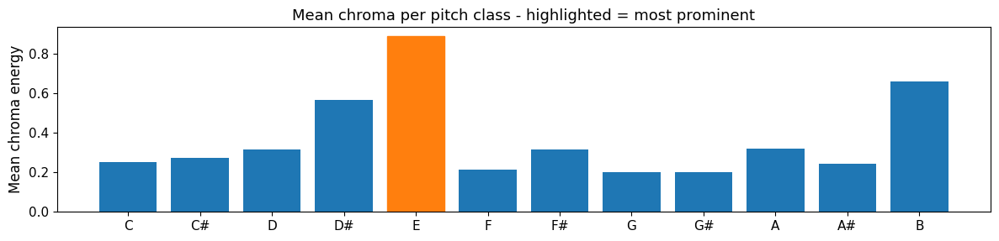

In [3]:
import matplotlib.pyplot as plt
plt.rcParams.update({
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "figure.figsize": (10, 4),
    "figure.dpi": 100,
    "savefig.dpi": 150,
    "axes.spines.top": False,
    "axes.spines.right": False,
})
pitch_names = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
chroma_mean = chroma.mean(axis=1)
mean_chroma = chroma_mean

idx = int(np.argmax(mean_chroma))
prominent = pitch_names[idx]
prominence = float(mean_chroma[idx])

# simple bar plot highlighting the most prominent class
plt.figure(figsize=(10, 2.5))
bars = plt.bar(pitch_names, mean_chroma, color='C0')
bars[idx].set_color('C1')
plt.ylabel('Mean chroma energy')
plt.title('Mean chroma per pitch class - highlighted = most prominent')
plt.tight_layout()
plt.show()


Let us then turn to another feature, trying to estimate the tempo of the song. We can begin by making a *tempogram*, which estimates prominent tempo profiles over time: 

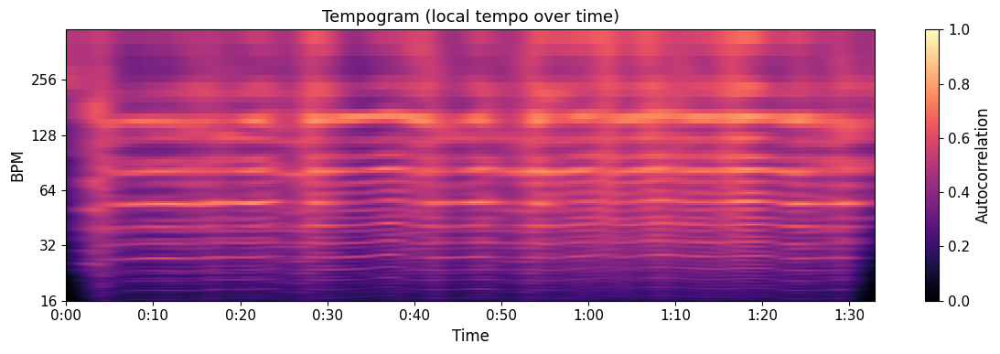

In [4]:
import matplotlib.pyplot as plt
plt.rcParams.update({
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "figure.figsize": (10, 4),
    "figure.dpi": 100,
    "savefig.dpi": 150,
    "axes.spines.top": False,
    "axes.spines.right": False,
})

# Tempogram (rhythmic autocorrelation)
onset_env = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
tempogram = librosa.feature.tempogram(onset_envelope=onset_env, sr=sr, hop_length=hop_length)

plt.figure(figsize=(10, 3.3))
librosa.display.specshow(tempogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='tempo', cmap='magma')
plt.colorbar(label='Autocorrelation')
plt.title('Tempogram (local tempo over time)')
plt.tight_layout()
plt.show()

From this plot, it is not so easy to see what the estimated tempo is. However, if we ask the computer to smooth the signal and average across bands, we get a clearer result: 

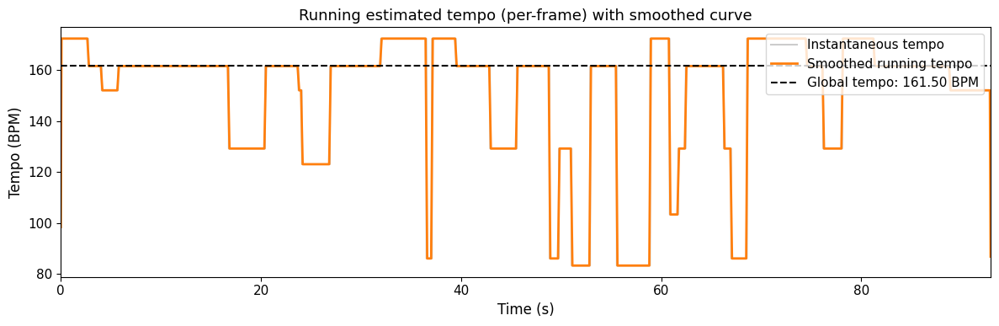

In [5]:
from librosa.feature import rhythm
import matplotlib.pyplot as plt
plt.rcParams.update({
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "figure.figsize": (10, 4),
    "figure.dpi": 100,
    "savefig.dpi": 150,
    "axes.spines.top": False,
    "axes.spines.right": False,
})

times = librosa.frames_to_time(np.arange(len(onset_env)), sr=sr, hop_length=hop_length)
tempo_est = librosa.feature.tempo(onset_envelope=onset_env, sr=sr, hop_length=hop_length)
tempo_running = rhythm.tempo(onset_envelope=onset_env, sr=sr, hop_length=hop_length, aggregate=None)

# Smooth the running estimate with a short moving average to reduce jitter
win = 7
kernel = np.ones(win) / win
tempo_smooth = np.convolve(tempo_running, kernel, mode='same')

plt.figure(figsize=(10, 3.3))
plt.plot(times, tempo_running, color='gray', alpha=0.4, label='Instantaneous tempo')
plt.plot(times, tempo_smooth, color='C1', linewidth=2, label='Smoothed running tempo')
plt.axhline(float(tempo_est[0]), color='k', linestyle='--', linewidth=1.5, label=f'Global tempo: {tempo_est[0]:.2f} BPM')

# Optionally mark beat times
if 'beat_times' in globals():
    for bt in beat_times:
        plt.axvline(bt, color='r', linestyle=':', alpha=0.25, linewidth=0.8)

plt.xlabel('Time (s)')
plt.ylabel('Tempo (BPM)')
plt.title('Running estimated tempo (per-frame) with smoothed curve')
plt.legend(loc='upper right')
plt.xlim(times[0], times[-1])
plt.tight_layout()
plt.show()


Notice how the instantaneous tempo fluctuates quite a lot. This is common with real-world signals and is one of the reasons we typically average ("smooth") the signal to find a result. Here the estimated tempo of 161 BPM is quite close to what a human would guess. 

### Source separation

*Source separation* means isolating individual instruments or voices from a mixed audio signal. Human listeners do this constantly: recall [auditory scene analysis](psychoacoustics.ipynb) from the psychoacoustics chapter, the process by which the auditory system organises a mixture of sound into separate streams. Machines face the same problem, and it is still not fully solved. A simple example is shown below, where the signal is split into a "harmonic" and a "percussive" component: 

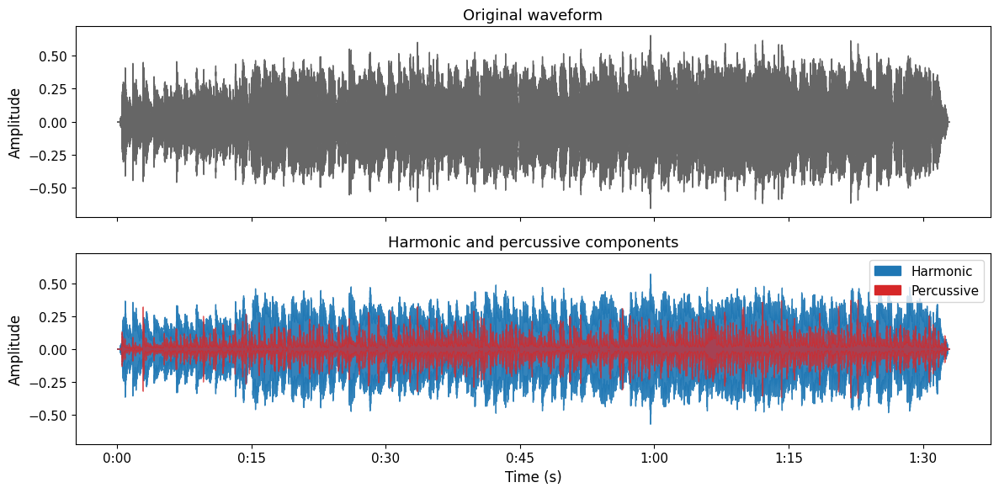

In [6]:
import matplotlib.pyplot as plt
plt.rcParams.update({
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "figure.figsize": (10, 4),
    "figure.dpi": 100,
    "savefig.dpi": 150,
    "axes.spines.top": False,
    "axes.spines.right": False,
})
y_harmonic, y_percussive = librosa.effects.hpss(y)

fig, (ax_o, ax_hp) = plt.subplots(2, 1, figsize=(10, 5), sharex=True, sharey=True)
librosa.display.waveshow(y, sr=sr, ax=ax_o, color="0.4")
ax_o.set(title="Original waveform", ylabel="Amplitude", xlabel="")
librosa.display.waveshow(y_harmonic, sr=sr, ax=ax_hp, color="#1f77b4", alpha=0.9)
librosa.display.waveshow(y_percussive, sr=sr, ax=ax_hp, color="#d62728", alpha=0.7)
ax_hp.set(title="Harmonic and percussive components", ylabel="Amplitude", xlabel="Time (s)")
import matplotlib.patches as mpatches
ax_hp.legend(handles=[mpatches.Patch(color="#1f77b4", label="Harmonic"),
                      mpatches.Patch(color="#d62728", label="Percussive")], loc="upper right")
plt.tight_layout()
plt.show()

display(Audio(y_harmonic, rate=sr))
display(Audio(y_percussive, rate=sr))

Traditional signal-processing methods such as this are mature and well understood. Deep-learning approaches, which learn the sound of voices, drums, or bass from large collections of recordings, often do better in difficult cases, such as separating many overlapping sources, but rule-based methods remain useful when you need real-time results or are working with limited data and compute.

The most capable systems today can split a finished mix into *stems*, separate tracks for vocals, drums, bass, and the remaining instruments:

```{image} figures/machine-listening/week6_image2.png
:width: 100%
```

*Image source: from* {cite:t}`Manilow2020`.

A range of source separation tools is available, each with its own trade-offs:

- **Commercial online tools** (e.g., [moises.ai](https://moises.ai), [lalal.ai](https://www.lalal.ai)): fast, cloud-based processing with intuitive interfaces. These services usually give high-quality separation for common instruments in Western popular music, which makes them accessible to non-experts. Control over the algorithms is limited, and full functionality usually requires a paid subscription.
- **Open source tools** (e.g., [Spleeter by Deezer](https://github.com/deezer/spleeter), [Demucs](https://github.com/facebookresearch/demucs)): free and highly customisable. Users can adjust parameters, retrain models for specific instruments or genres, and integrate separation into research workflows. They require command-line or programming experience, and processing speed and quality depend on local hardware.

Which tool fits best depends on your technical background, the complexity of the task, and whether you value ease of use or customisation. Separated stems are useful far beyond remixing. Isolating a drum or bass track makes onset detection and timing analysis much easier, as noted in [time and rhythm](time-and-rhythm.ipynb).

```{exercise} Optional: separate a track into stems
:label: exercise-source-separation-moises

Sign up for a free account at [moises.ai](http://moises.ai). Upload a track of your choice (preferably something groove-based, or with at least drums and a few other rhythm instruments). Listen to the individual stems produced by the source separation.

- Do you notice any distortions, glitches, or loss of frequency information in the separated stems?
- Reflect on how useful such a separation would be for transcription or signal analysis purposes (both rhythm and pitch).
- Consider the limitations of current source separation algorithms and how they might affect your analysis.

Reflect: How did the quality of the separated stems compare to your expectations? In what ways could these tools assist or hinder your musical analysis?
```

### Segmentation and event detection

Segmentation and event detection are about locating boundaries and discrete events such as onsets, beats, or section changes. This is the machine's version of the grouping problem Bregman posed in [psychoacoustics](psychoacoustics.ipynb): deciding which parts of a continuous signal belong together. The auditory system solves it before you notice there was a problem; an algorithm has to be told what counts as a boundary. A traditional method looks for repeating patterns with a [self-similarity matrix](https://en.wikipedia.org/wiki/Self-similarity). The signal is compared with itself, and recurring patterns become visible: 

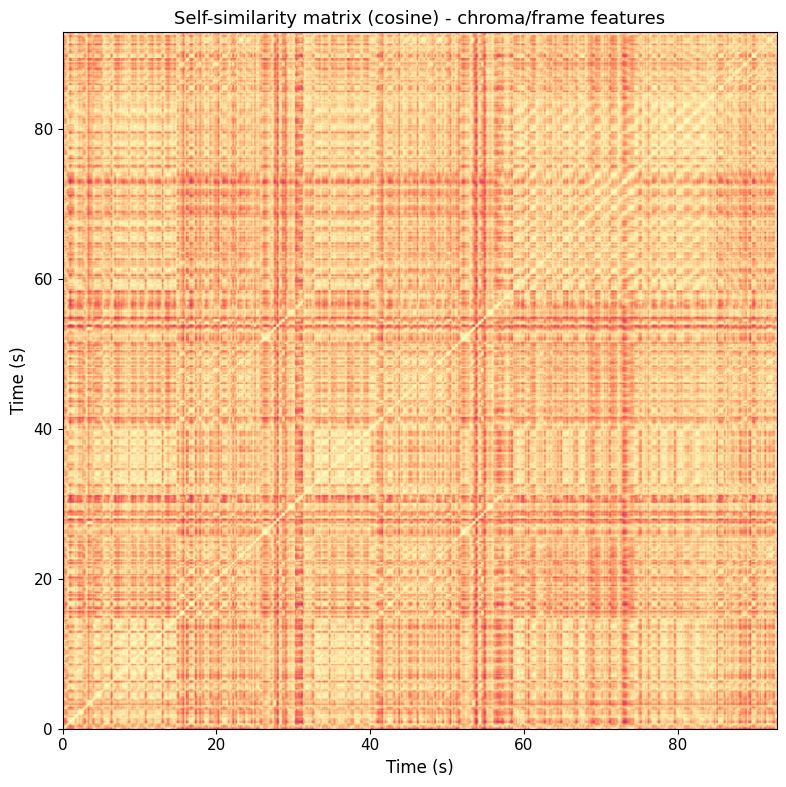

In [7]:
import matplotlib.pyplot as plt
plt.rcParams.update({
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "figure.figsize": (10, 4),
    "figure.dpi": 100,
    "savefig.dpi": 150,
    "axes.spines.top": False,
    "axes.spines.right": False,
})
# Compute and plot a self-similarity matrix using chroma frame features
X_feat = chroma.T  # shape: (n_frames, n_pitches)

# L2-normalize frame vectors (avoid division by zero)
norms = np.linalg.norm(X_feat, axis=1, keepdims=True)
norms[norms == 0] = 1.0
Xn = X_feat / norms

# Cosine self-similarity (frames x frames)
ssm = np.dot(Xn, Xn.T)

# Plot the self-similarity matrix mapped to time (uses `times` array already in the notebook)
plt.figure(figsize=(10, 6))
extent = [times[0], times[-1], times[0], times[-1]]  # map indices to seconds
plt.imshow(ssm, origin='lower', aspect='auto', cmap='magma', extent=extent, vmin=0, vmax=1)
plt.xlabel('Time (s)')
plt.ylabel('Time (s)')
plt.title('Self-similarity matrix (cosine) - chroma/frame features')

# Optionally overlay beat times if available
if 'beat_times' in globals():
    for bt in beat_times:
        plt.axvline(bt, color='w', linestyle='--', linewidth=0.5, alpha=0.3)
        plt.axhline(bt, color='w', linestyle='--', linewidth=0.5, alpha=0.3)

plt.tight_layout()
plt.show()


The self-similarity matrix shows the pairwise similarity between frames. Repeating sections appear as off-diagonal parallel stripes, and boundaries appear where similarity across the diagonal drops. We can then ask the computer to (A) detect boundary times (change points) and (B) group frames into part labels (verse/chorus/bridge, or repeated segments). Combining local novelty (for transitions) with global clustering (for part grouping) is the standard practical route from a self-similarity matrix to musical parts and transitions.

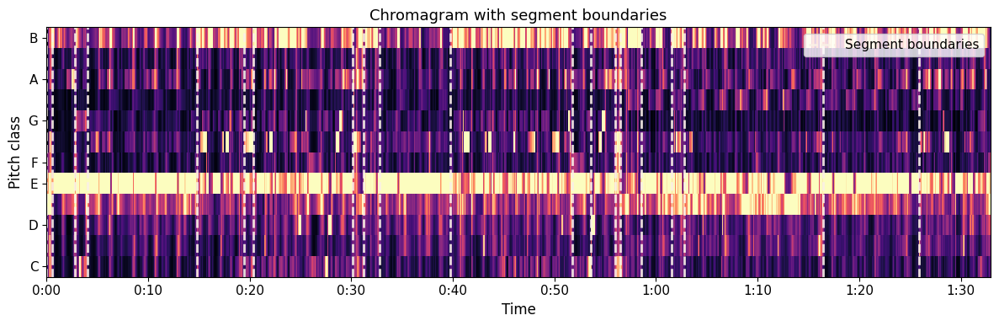

In [8]:
import matplotlib.pyplot as plt
plt.rcParams.update({
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "figure.figsize": (10, 4),
    "figure.dpi": 100,
    "savefig.dpi": 150,
    "axes.spines.top": False,
    "axes.spines.right": False,
})
chroma = librosa.feature.chroma_cqt(y=y, sr=sr)
bounds = librosa.segment.agglomerative(chroma, 20)
bound_times = librosa.frames_to_time(bounds, sr=sr)

import matplotlib.transforms as mpt
fig, ax = plt.subplots(figsize=(10, 3.3))
trans = mpt.blended_transform_factory(
            ax.transData, ax.transAxes)
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', ax=ax)
ax.vlines(bound_times, 0, 1, color='linen', linestyle='--',
          linewidth=2, alpha=0.9, label='Segment boundaries',
          transform=trans)
ax.legend()
ax.set(title='Chromagram with segment boundaries')
plt.tight_layout()
plt.show()

It is further possible to compare the segments to evaluate the musical form. However, this requires more code and interpretation, so we will not consider that further here. 

### Worked example: what can we now say about this track?

Each step above produced one number or one picture. On their own they are just outputs. The point of machine listening is what happens when you put them together and ask a *musical* question of them.

In [9]:
# Pull together what the earlier cells computed, and add a key estimate.
# Krumhansl-Schmuckler: correlate the mean chroma with major/minor key profiles.
major_profile = np.array([6.35, 2.23, 3.48, 2.33, 4.38, 4.09,
                          2.52, 5.19, 2.39, 3.66, 2.29, 2.88])
minor_profile = np.array([6.33, 2.68, 3.52, 5.38, 2.60, 3.53,
                          2.54, 4.75, 3.98, 2.69, 3.34, 3.17])

def best_key(mean_chroma):
    scores = {}
    for shift in range(12):
        rotated = np.roll(mean_chroma, -shift)
        scores[(pitch_names[shift], "major")] = np.corrcoef(rotated, major_profile)[0, 1]
        scores[(pitch_names[shift], "minor")] = np.corrcoef(rotated, minor_profile)[0, 1]
    return max(scores, key=scores.get), max(scores.values())

(key_name, key_mode), key_score = best_key(chroma_mean)
tempo_bpm = float(tempo_est[0])
_, beat_frames = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr, hop_length=hop_length)
duration = len(y) / sr

print(f"Duration            : {duration:.1f} s")
print(f"Most prominent pitch: {prominent}")
print(f"Estimated key       : {key_name} {key_mode} (correlation {key_score:.2f})")
print(f"Estimated tempo     : {tempo_bpm:.1f} BPM")
print(f"Beats tracked       : {len(beat_frames)} "
      f"({len(beat_frames) / duration * 60:.0f} per minute)")
print(f"Segment boundaries  : {len(bound_times)} at "
      f"{', '.join(f'{t:.1f}s' for t in bound_times[:6])} ...")

Duration            : 92.9 s
Most prominent pitch: E
Estimated key       : E major (correlation 0.75)
Estimated tempo     : 161.5 BPM
Beats tracked       : 255 (165 per minute)
Segment boundaries  : 20 at 0.0s, 0.5s, 2.8s, 4.0s, 14.8s, 19.5s ...


#### Reading the output critically

A summary like this is only worth as much as your willingness to check it against your ears. Play the excerpt again and ask three questions.

**Is the key estimate meaningful?** The chromagram is confident about E, and the key profile agrees on an E centre. That much is a fair description. But the profiles were derived from Western common-practice tonality, and they force a choice between exactly two answers: major or minor. Coltrane's treatment of this tune is modal and moves between minor and major over the same centre, so a single label averages away a contrast that is central to how the performance works. A tool that can only choose between two categories will always choose between them, however badly they fit.

**Is the tempo the tempo?** The estimate is a plausible number, but "the tempo" of a piece is not a single physical quantity. Beat-tracking algorithms routinely lock onto a subdivision or a grouping rather than the level a listener would tap, which is the notorious octave error of doubling or halving the true rate. The waltz metre of this tune makes that especially likely. Tap along yourself and compare.

**Are these the sections?** No. The segmentation returned twenty boundaries because the code *asked* for twenty (`librosa.segment.agglomerative(chroma, 20)`). Change that number and you get a different musical form. The algorithm finds points where the chroma texture changes; whether those points are musically meaningful boundaries is a judgement it never makes.

This is the honest summary of what machine listening gives a musicologist: fast, consistent, reproducible descriptions of *acoustic* properties, over more music than anyone could listen to. What it does not give is musical interpretation. In the terms of the [four levels of description](#levels-of-description), it is very good at the physical signal and the digital representation, it approximates perception where someone has built a perceptual model into the features, and it does not reach interpretation at all. The features are evidence; the argument is still yours.

```{exercise} Run the pipeline on your own music
Replace the audio file at the top of this chapter with a track of your own (any short excerpt will do) and re-run the notebook.

- Which of the four outputs—prominent pitch class, key, tempo, segment boundaries—matches what you hear?
- Which one is most wrong, and can you say *why* from the plots?
- Try a track that you expect to break the analysis: unpitched percussion, a free-tempo recording, a non-Western tradition, a heavily processed electronic piece. What does it report?
```

```{exercise} Audit a dataset
Pick one of the open datasets listed later in this chapter (GTZAN, MAESTRO, or MUSDB18) and find its documentation.

- What music is actually in it: which genres, which instruments, recorded where and when?
- Who chose the labels, and by what procedure?
- Name one musical question this dataset could answer well, and one it would answer badly or misleadingly.

GTZAN was assembled for {cite:t}`Tzanetakis2002`, the paper that established genre classification as an MIR task, and it has well-documented problems: duplicated tracks, mislabelled genres, and recording artefacts that make classification easier than it should be. {cite:t}`Sturm2014Horse` shows how a system can score well on a dataset like this while keying on something musically irrelevant. The dataset is still widely used. Why might that be?
```

## Music information retrieval

The last example already moved us from general machine listening into [music information retrieval](https://en.wikipedia.org/wiki/Music_information_retrieval) (MIR), a more specialised form of machine listening aimed at pulling structured, useful information out of musical audio and related data. MIR draws on signal processing, machine learning, music theory, and human-centred evaluation to support tasks such as metadata extraction, music search, analysis, learning, and interactive applications.

### MIR tasks

- **Classification and recognition** includes identifying instruments, genres, or whether a recording contains speech or music. When working with large music collections, this means tools that can tag files, find similar pieces, or detect instrumentation in recordings. Methods range from simple spectral/timbral feature matching to modern neural classifiers. Common pitfalls are dataset bias, noisy recordings, and confusion between timbrally similar instruments.

- **Recommendation systems** combine audio-derived features (timbre, tempo) with user behaviour to suggest music. Content-based recommenders use the audio descriptors themselves. Collaborative methods exploit listening patterns across users. Many modern systems are hybrid, and they help discover new music but are prone to bias and raise privacy concerns.

- **Automatic transcription systems** convert audio into symbolic scores (MIDI, MusicXML). Monophonic pitch tracking is quite stable these days, but full polyphonic, multi-instrument transcription remains a challenge. Techniques include spectral analysis with onset/pitch heuristics, probabilistic sequence models, and end-to-end deep networks.

- **Segmentation and structure analysis** help find meaningful regions (intro, verse, chorus) or discrete events (onsets, section boundaries) in audio files. Approaches use self-similarity and novelty detection or trained boundary detectors. These tools are useful for form analysis, remixing, and practice. However, "meaningful" boundaries are often subjective, so evaluation uses tolerance windows and human judgement.

- **Question-answering systems** let you query audio with natural language (e.g., “Find tracks with a trumpet solo” or “show passages in major mode with fast tempo”). They combine audio tagging, metadata, and lyrics to match queries to musical passages. The hard part is mapping everyday language to reliable musical labels.

- **Mood, emotion, and other higher-level feature extraction** are active research topics in the MIR community. These estimate human responses to music, which is where MIR crosses paths with music psychology research. This is challenging, given large individual differences and the impact of cultural background and context.

```{admonition} Question
:class: question
Can you think of any examples of how these techniques are implemented in systems you use?
```

### Music data

Data is at the core of any information retrieval system. Traditionally, MIR tasks worked mainly with *symbolic data*, in the form of [MIDI](https://en.wikipedia.org/wiki/MIDI) or [MusicXML](https://en.wikipedia.org/wiki/MusicXML) files. Over the last decades, most research has shifted to audio files, which can be seen as a form of *subsymbolic data*: they do not deal with "symbols" but with the raw audio itself.

Additional information can be found in [metadata](https://en.wikipedia.org/wiki/Metadata), including contextual information such as artist or album details. [Paradata](https://en.wikipedia.org/wiki/Paradata) can tell us how the data was recorded or analysed, while [user data](https://en.wikipedia.org/wiki/Personal_data) can reveal personal information about how people access and use it, such as listening patterns and preferences.

For researchers, one major challenge is getting access to diverse music data while respecting legal and ethical constraints. Copyright, performer and composer rights, licensing terms, and privacy (for user or performer data) all restrict what can be downloaded, redistributed, or used for training and publication. These constraints affect dataset size, representativeness, and the ability to share reproducible code and trained models.

To work around some of this, researchers often turn to openly licensed resources and well-documented research datasets, and publish the licence and provenance of each item used. Another option is to rely on metadata or derived representations, such as spectrograms, when raw audio cannot be redistributed, which reduces legal risk and improves reproducibility.


### "Multimodal" MIR

Multimodal MIR combines audio with other kinds of data: lyrics can disambiguate mood, scores and MIDI give exact pitches and timings, and video shows performer gestures. The combination also makes systems more robust, since gaps in a noisy recording can sometimes be filled from an aligned score or lyric line.

```{admonition} Question
:class: question
Why is "multimodal data" a challenging term when working between music psychology and technology?
```

Working across data types raises two recurring problems. The first is temporal alignment, since audio, scores, lyric timestamps, and video frames run on different clocks, and small timing errors can break a task such as matching lyrics to sound. The second is comparison, which many systems solve with *embeddings*: lists of numbers produced by a trained model that summarise a clip, a lyric line, or an image so that similar items get similar numbers.

Concrete examples include score-informed source separation, which needs tight audio–MIDI alignment; lyric-aware search, which needs reliable text timestamps; music-video analysis such as visual beat tracking, which depends on accurate audio–video synchronisation; and recommendation systems that fuse audio with listening logs, which raise privacy and fairness questions.

## Artificial intelligence

Artificial Intelligence (AI) is commonly used to describe machine systems that perform tasks that normally require human cognitive abilities, such as perception, learning, reasoning, planning, and natural-language understanding. In music, this includes systems that can compose, perform, and analyse music.


### Artificial neural networks

Most learning-based systems in this chapter are built from [artificial neural networks](https://en.wikipedia.org/wiki/Neural_network_(machine_learning)) (ANNs). [The brain](the-brain.ipynb) explains where the metaphor comes from and how far it stretches; here is the mechanism. A network is a set of simple units arranged in layers. Each unit multiplies its inputs by a set of weights, adds them up, passes the total through a non-linear function, and hands the result to the next layer.

```mermaid
graph LR
  subgraph Input Layer
    A1((Input 1))
    A2((Input 2))
    A3((Input 3))
  end

  subgraph Hidden Layer
    B1((Hidden 1))
    B2((Hidden 2))
    B3((Hidden 3))
  end

  subgraph Output Layer
    C1((Output 1))
    C2((Output 2))
  end

  %% Input to Hidden
  A1 -- w11 --> B1
  A1 -- w12 --> B2
  A1 -- w13 --> B3
  A2 -- w21 --> B1
  A2 -- w22 --> B2
  A2 -- w23 --> B3
  A3 -- w31 --> B1
  A3 -- w32 --> B2
  A3 -- w33 --> B3

  %% Hidden to Output
  B1 -- v11 --> C1
  B1 -- v12 --> C2
  B2 -- v21 --> C1
  B2 -- v22 --> C2
  B3 -- v31 --> C1
  B3 -- v32 --> C2
```

*A simple artificial neural network with an input layer, one hidden layer, and an output layer.*

Training means showing the network many examples, measuring how wrong its output is, and nudging every weight a little in the direction that would have made it less wrong. Repeat this a few million times and the weights settle into something that generalises, or at least that works on data resembling what it was shown. *Deep* learning simply means stacking many layers, which lets early layers pick up local detail (a spectral edge, a transient) and later layers combine those into something more abstract (a timbre, a chord, a genre label).

Two consequences matter for the rest of this chapter. The features are no longer chosen by you but discovered by the network, which is what makes these systems powerful and also what makes them hard to interrogate. And whatever the training data contained is what the network learned, which is why the ethics section below is about datasets as much as about models.

### Rule-based vs learning-based systems

Although learning-based systems get most of the attention these days, it helps to distinguish two broad types of AI system: rule-based and learning-based. There are also hybrid approaches that mix the two.

Rule-based systems rely on deterministic signal-processing heuristics—peak picking, thresholding, spectral rules, and simple decision logic—to make decisions. They are compact, easy to interpret and tune, and well suited to low-latency, resource-constrained tasks such as onset detection or beat tracking. Their disadvantages are brittleness to noise and domain shifts (data unlike what they were tuned on), extensive hand-tuning, and limited ability to capture complex, data-driven patterns.

Learning-based approaches range from classical statistical models trained on hand-crafted features to modern deep networks that discover their own features (see the model families below). When labelled examples are scarce, models are often first trained on large amounts of unlabelled audio, for example by learning to judge whether two clips come from the same recording, a strategy called contrastive pretraining, and only then adjusted for the task at hand. These methods typically offer higher accuracy and adaptivity, but require more labelled data or compute, can be harder to interpret, and demand careful validation against domain mismatch and dataset bias.

Hybrid approaches combine signal-processing knowledge with learned components, for example letting a handcrafted onset detector propose events that a learned model refines, or enforcing musical constraints such as tempo and harmonicity on machine-learning outputs. A practical workflow is to start with a simple rule-based baseline and introduce learned components only where they earn their added complexity.

### Models

You do not need to be able to build these, but you will meet their names in the literature, and it helps to know roughly what each one is good at. Broadly: *sequence models* (HMMs, RNNs) walk through a signal step by step and are good at things that unfold in order, such as notes or chords; *convolutional models* look at a spectrogram much as an image, and are good at texture and timbre; *transformers* can relate any moment to any other, which suits long-range musical structure but costs a lot of computation.

:::{note} Dig deeper: model families
:class: dropdown
- [Hidden Markov Models (HMMs)](https://en.wikipedia.org/wiki/Hidden_Markov_model) describe a signal as moving between a small set of hidden states, such as notes or chords, and estimate the most likely state sequence. They are lightweight and work with little data, but struggle when musical patterns stretch over long spans.

- [Recurrent Neural Networks (RNNs)](https://en.wikipedia.org/wiki/Recurrent_neural_network) and [Long Short-Term Memory (LSTM)](https://en.wikipedia.org/wiki/Long_short-term_memory) networks process a sequence one step at a time, with LSTMs adding an internal memory for longer context. They handle moderate musical context well but are slower than models that process a whole sequence at once.

- Temporal or dilated convolutional networks (temporal CNNs, [TCNs](https://en.wikipedia.org/wiki/Temporal_convolutional_network)) apply the pattern-matching filters of a [convolutional neural network](https://en.wikipedia.org/wiki/Convolutional_neural_network) along the time axis, with deeper layers seeing longer stretches of signal. They compute efficiently and suit low-latency streaming, but the amount of context they see is fixed by the design.

- [Transformers](https://en.wikipedia.org/wiki/Transformer_(machine_learning_model)) and [attention-based models](https://en.wikipedia.org/wiki/Attention_(machine_learning)) let every moment in a sequence relate directly to every other, which suits long-range structure and tasks such as transcription and form analysis. They often give the best results but demand far more computation and memory, especially for long recordings.
:::

### Realtime vs offline

Machine listening systems can operate in different time modes, and the choice strongly affects algorithm design, latency, and evaluation.

- **Realtime (online)** — the system must answer while the music is still playing, as in a live accompaniment system or an interactive installation. It can only use audio that has already arrived, and it has a few tens of milliseconds to decide. That rules out anything that needs to see the whole piece, and usually means simpler, lighter methods.

- **Offline (batch)** — the system gets the whole recording and can take as long as it likes. It can look forwards as well as backwards, revise earlier decisions in light of later ones, and run expensive smoothing. This is the setting for transcription, structural analysis, and dataset annotation, and it is where accuracy is highest.

- **Hybrid** — run a fast online pass for immediate feedback and a slower offline pass afterwards to correct it.

The trade-off is unavoidable. Musical structure is easiest to identify once you have heard how it turned out, and a live system never has that luxury.

:::{note} Dig deeper: where the latency comes from
:class: dropdown
Latency ≈ window duration + model lookahead + processing time. With `n_fft=2048` at `sr=22050`, the analysis window alone is ≈ 92.9 ms, and a `hop_length` of 512 advances in 23.2 ms steps, so even before any model runs, the system is already that far behind the sound.

Realtime work therefore requires causal algorithms (causal filters, causal convolutions, stateful RNNs/TCNs, or streaming transformers with limited lookahead), a streaming frontend with short windows and small hops, cheap incremental features (onset strength, low-band log-mel, incremental CQT), and simple online post-processing (peak picking, adaptive thresholds). Compute has to be bounded and predictable to meet deployment constraints (CPU/GPU, battery, I/O), which in practice means lightweight models or hybrid pipelines with a rule-based front end and a small learned model.

Offline systems can instead use larger windows, global context, and bidirectional models (bi-RNNs, full attention), plus expensive post-processing (Viterbi smoothing, global segmentation, search) and whole-track normalisation.
:::

Design decisions should follow the application. Live interaction needs minimal, predictable latency and causal algorithms, whereas analysis and annotation can exploit full-context offline methods for higher fidelity.

## Examples

There are many practical examples of machine listening and MIR in both research and industry. Below are curated open‑source projects followed by some commercial examples.

<details>
<summary>Open‑source examples</summary>

- **[librosa](https://librosa.org)** — A lightweight, high‑level Python library for audio analysis and feature extraction (spectrograms, chroma, MFCCs, tempograms). Good for prototyping and education. (pip install librosa)  

- **[Essentia](https://essentia.upf.edu)** — C++ DSP library with Python bindings: very large feature set, audio descriptors, and production‑grade implementations of many MIR algorithms (beat, onset, pitch, timbre). Useful when performance and completeness matter.  

- **[madmom](https://github.com/CPJKU/madmom)** — Focused on MIR tasks such as beat tracking, onset detection, and tempo estimation with efficient Cython code and pretrained models. Good for beat/onset pipelines and realtime-friendly algorithms.  

- **[Spleeter (Deezer)](https://github.com/deezer/spleeter)** — Fast, easy-to-use source separation (2/4/5 stems) with pretrained U‑Net models. Great for quick vocal/instrument separation and dataset preparation.  

- **[Open‑Unmix (UMX)](https://github.com/sigsep/open-unmix)** — Open, research‑oriented music source separation model (frequency‑domain, PyTorch) and evaluation scripts (museval). Good for reproducible separation experiments.  

- **[Demucs](https://github.com/facebookresearch/demucs)** — Time‑domain neural separator (waveform) that often yields strong perceptual quality for music separation. Useful as a modern baseline for source separation work.  

- **[CREPE](https://github.com/marl/crepe)** — A convolutional model for pitch/F0 estimation directly from waveform. Provides frame‑level pitch estimates and confidence measures.  

- **[Onsets & Frames (Magenta)](https://github.com/magenta/onsets-frames)** — Neural system for piano transcription (onset detection + framewise prediction + decoding). Good example of end‑to‑end transcription pipelines.  

- **[mir_eval](https://github.com/craffel/mir_eval)** / **[museval](https://github.com/sigsep/museval)** — Lightweight toolkits for standard MIR evaluation metrics. Use these for consistent, comparable results.  

- **[JAMS](https://github.com/marl/jams)** — JSON‑based format and Python tools for storing and exchanging musical annotations (beats, chords, segments). Useful for reproducible annotation workflows.  
</details>

<details>
<summary>Datasets & benchmarks (open)</summary>

- **[MUSDB18](https://sigsep.github.io/datasets/musdb.html)** — Standard dataset for music source separation (stereo mixtures + stems).

- **[MAESTRO](https://magenta.tensorflow.org/datasets/maestro)** — Aligned piano audio + MIDI dataset used for transcription and generation.

- **[GTZAN](http://marsyas.info/downloads/datasets.html)** / **[Million Song Dataset](http://millionsongdataset.com)** — Popular collections for genre / large‑scale analysis (beware of known issues and biases).
</details>

<details>
<summary>Commercial examples</summary>

- [**Shazam**](https://www.shazam.com) — A consumer-facing music recognition service that identifies songs from short audio clips and returns metadata (title, artist, album) and listening links. Widely integrated into iOS/Android and many commercial platforms.

- [**ACRCloud**](https://www.acrcloud.com) — Commercial audio fingerprinting and automatic content recognition (ACR) for music identification, broadcast monitoring, copyright compliance, and synchronised second‑screen experiences. Offers cloud APIs and on‑device SDKs for streaming, broadcasting, and automotive use cases.

- [**Gracenote**](https://www.gracenote.com) — Metadata and music‑recognition services powering search, recommendation, and interactive media features for streaming platforms, consumer electronics, and infotainment systems. Commonly used to enrich catalogues and enable content discovery. 

- [**Audible Magic**](https://www.audiblemagic.com) — Content identification and rights management platform specialising in copyright compliance, fingerprinting, and monetisation for user‑generated and professional video/audio content. Used by platforms that need automated rights enforcement and revenue attribution. 

- [**Samba TV**](https://www.samba.tv) — A television analytics company that uses automatic content recognition (ACR) to identify what is playing on screen, powering audience measurement, personalised advertising, and interactive TV experiences.
</details>

```{admonition} Other examples
:class: question
Can you think of any other examples of machine listening or music information retrieval?
```


### Listening to a room

The examples above analyse *music*. But the machine-listening pipeline of this chapter—waveform → framing → features → decision—does not care whether the sound is a saxophone solo or a café. Here we point it at a *room* instead, using [ambiscape](https://github.com/fourMs/ambiscape), a small toolbox for long-duration soundscape analysis (`pip install ambiscape`).

One idea makes the shift worth the trouble. Music information retrieval was built to attend to the *foreground*—the notes, the beat—and to treat everything else as "background noise" to filter away. A soundscape inverts this. Its subject *is* the background: the keynote hum, the diffuse field, the slow envelope of the day. Analysing a room is often music analysis with the attention turned around. This is the signal/noise duality from the [acoustics](acoustics.ipynb) chapter in action: what counts as noise depends entirely on what counts as signal.

We first synthesise a short "room": a low-frequency mechanical rumble (think of a fan or ventilation) with a few broadband events (a door, footsteps) over a faint floor.

In [ ]:
import os, tempfile
import numpy as np
import soundfile as sf
from scipy.signal import butter, lfilter

fs, dur = 48000, 20.0
t = np.arange(int(dur * fs)) / fs
rng = np.random.default_rng(0)

# a low-frequency mechanical "room tone" (fan / ventilation)
b, a = butter(2, 200 / (fs / 2), "low")
rumble = lfilter(b, a, rng.standard_normal(len(t)))
room = 0.3 * rumble / np.max(np.abs(rumble))
# a few broadband events (a door, footsteps)
for onset in (3.0, 8.5, 14.0):
    i = int(onset * fs)
    ev = rng.standard_normal(int(0.15 * fs)) * np.exp(-np.linspace(0, 6, int(0.15 * fs)))
    room[i:i + len(ev)] += 0.4 * ev
room += 0.01 * rng.standard_normal(len(t))            # faint diffuse floor

work = tempfile.mkdtemp()
sf.write(os.path.join(work, "room.wav"), room.astype(np.float32), fs)

import ambiscape as asc
from ambiscape import features, mechanical, anthropophony, geophony

sess = asc.open_recording(os.path.join(work, "room.wav"))
F = features.load_features(features.extract_session(sess, os.path.join(work, "feat")))

# the SAME features the chapter used on music, now on a room
print(f"median spectral centroid : {np.median(F['centroid']):.0f} Hz")
print(f"median spectral flatness : {np.median(F['flatness']):.3f}")

# which source domain owns this room?
print("\nsource decomposition (index in 0..1):")
print(f"  mechanical    : {mechanical.summarize_mechanical(F)['mechanical_index']}")
print(f"  anthropophony : {anthropophony.summarize_anthropophony(F)['anthropophony_index']}")
print(f"  geophony      : {geophony.summarize_geophony(F)['geophony_index']}")
print(f"  (energy below 250 Hz: {mechanical.summarize_mechanical(F)['mech_lowfreq_fraction']:.0%})")

  extracted room.wav (20s)
median spectral centroid : 352 Hz
median spectral flatness : 0.030

source decomposition (index in 0..1):
  mechanical    : 0.437
  anthropophony : 0.129
  geophony      : 0.636
  (energy below 250 Hz: 86%)


The room's spectral centre of gravity sits low and its flatness is small—a tonal rumble, not a broadband hiss—and the source decomposition names it: this room is *mechanical*, with the great majority of its energy below 250 Hz. Run the same analysis on a real 27-minute train ride and the verdict is starker still, with about 93% of the energy below 250 Hz, an "enormous machine that happens to be carrying people," over which the announcements and conversations are brief, marginal figures.

The same tools carry the same ethical weight as any machine listening. Because a soundscape is often recorded in an inhabited, private space, ambiscape can export a *non-identifying feature stream* (a low-rate table of level and spectral descriptors, below the timescale of intelligible speech). It also includes a voice-activity gate to check an excerpt before it is shared, which is a concrete form of the principle from the ethics section below: publish features, not recordings.

```{admonition} Try it
:class: question
Record 60 seconds of two rooms you know—a kitchen and a bedroom, say—and run the source decomposition on each. Which domain dominates each, and does the number match what you hear?
```

#### Hearing direction: ambisonic recordings

A single microphone captures how much sound there is, but not where it comes from. An [ambisonic](https://en.wikipedia.org/wiki/Ambisonics) recording, introduced in [electroacoustics](electroacoustics.ipynb), stores the sound field itself in four channels known as B-format: an omnidirectional channel W capturing overall pressure, and three figure-of-eight channels X, Y, and Z capturing the pressure gradient along the front–back, left–right, and up–down axes. Together they describe, at every instant, how much sound there is and which way it is going. AmbiX is the channel ordering and normalisation convention most software now expects.

For machine listening, this offers an analytical handle that no mono recording can. Combining the omnidirectional channel with the three gradient channels yields, frame by frame, an estimate of the direction energy is flowing from, and of how strongly that estimate agrees with itself. A single dominant source produces a consistent direction; a reverberant field produces directions that point everywhere at once. The resulting *diffuseness* measure separates a room with one talker in it from a room full of murmur, even when the two have identical levels and spectra. For soundscape analysis, direction and diffuseness sit naturally alongside the level and spectral descriptors used above, telling you whether a room's sound has a focus or surrounds the listener from everywhere.

### Listening to a collection

The same pipeline scales once more. We have pointed it at a single piece and then at a room; the
third step is to point it at a whole library and ask how the tracks relate to each other.
[musiscape](https://github.com/fourMs/musiscape) does that (`pip install musiscape`), taking a folder
tree where each subfolder is an album and producing visualisations you can compare at a glance: how
albums differ, which tracks resemble which, how internally consistent each album is, and where the
outliers sit. Its [documentation](https://fourms.github.io/musiscape/) has an illustrated gallery of
the styles, which is the quickest way to see whether it would answer a question you have.

It is worth noticing what changes as you move up these three scales, because it is not the method. At
every scale the pipeline is still waveform, framing, features, decision. What changes is the question
you can sensibly ask of the output. From one piece you can ask about notes and phrases; from a room,
about states and rhythms measured in minutes; from a collection, about similarity and grouping. Try
asking a collection-scale question of a single recording and you will get an answer, and it will not
mean anything.

musiscape and ambiscape are siblings and share machinery, including the circular statistics (statistics for values that wrap around, such as pitch classes or clock times) and the Schaeffer-derived typology you met earlier. That is deliberate, since a tonal centre is a tonal centre
whether you are describing an album or an afternoon in a courtyard.

## Machine vs human listening

Human (music) psychology and machine listening/technology form a mutually reinforcing loop. Psychological knowledge constrains and guides algorithm design, while technology supplies tools, data, and interventions that extend what we can measure, model, and apply. Key points and practical implications:

### How music psychology informs technology

Knowledge of how people hear guides what machines are built to measure, from perceptually scaled features to evaluation by listening tests. The details are collected below for those who want them.

:::{note} Going deeper: how psychology informs technology
:class: dropdown
Perceptual representations derived from psychoacoustics—such as mel and ERB scales, loudness models, and masking curves—inform feature design and loss functions so that systems weight signal components in ways that match human sensitivity. This yields better compression, perceptual losses, and salience-aware processing.

Human temporal integration, memory limits, and expectancy shape choices for window and hop sizes, context length, and model architecture. Knowing how listeners integrate information over time helps decide whether to use short receptive fields, longer temporal context, or attention mechanisms to capture the appropriate temporal framing for a task.

Clear task definitions and annotation schemes benefit from psychological constructs. Labelling targets in terms that reflect perceived categories (e.g., emotion, groove, perceived key) produces datasets and objectives that align with human judgements rather than with low-level signal properties, improving model relevance and interpretability.

Evaluation practice is guided by listening-based methods. Objective metrics should be calibrated against perceptual judgements using listening tests so that measured improvements correspond to meaningful changes for users. Psychological methods help design rigorous, reliable perceptual evaluations.

Interaction and UX design draw on models of attention, affordance, and mental workload to produce interfaces and feedback that match user expectations. Insights from music psychology guide how to present analysis, how much detail to expose, and how to scaffold tasks such as practice tools or tutoring so they are cognitively effective and engaging.
:::

### How technology supports music psychology

Technology repays the favour with better stimuli, larger datasets, and new instruments for measuring listeners. Again, the details sit below.

:::{note} Going deeper: how technology supports psychology
:class: dropdown
Technology enables scalable data collection and analysis by providing audio repositories, crowdsourcing platforms, and annotation tools that make it feasible to gather large behavioural datasets and diverse stimuli. These resources support robust, ecologically valid studies by broadening the range of musical examples and participant populations that can be analysed.

Precise stimulus control and replication are made possible through synthesisers, signal‑processing toolkits, and digital audio workstations (DAWs). These tools let researchers generate tightly controlled stimuli to isolate perceptual variables, run repeatable manipulations, and share identical materials across labs for reproducible experiments.

Instrumentation for measurement—such as EEG, MEG, fMRI, motion capture, eye‑tracking, and physiological sensors—provides objective access to neural, motor, and autonomic responses to music. Combined with careful experimental design, these modalities allow researchers to link behavioural effects to underlying physiological processes and to explore timing, localisation, and dynamics of musical perception and action.

Computational models and simulation expand the theoretical toolkit. Machine learning and formal modelling enable quantitative hypotheses (predictive coding, attention models), permit in silico testing of ideas, and can simulate listener groups or clinical conditions (for example, hearing loss). These approaches help formalise perceptual theories and generate testable predictions for empirical work.

Finally, technology supports translation of psychological insights into real‑world interventions and applications. Examples include adaptive tutoring systems, hearing‑assistive signal processing, music‑therapy apps, and context‑aware recommendation engines that operationalise lab findings into tools with practical impact.
:::

### Some considerations

:::{note} Dig deeper: designing and evaluating perceptually grounded systems
:class: dropdown
Feature design should be grounded in auditory perception. Representations such as mel‑spectrograms, ERB‑based filters, and perceptual weighting derived from auditory filterbanks or loudness models produce features and loss functions that better align with human hearing. Using perceptually motivated front ends (and perceptual distance measures) helps models focus on signal components that matter for listeners rather than on raw signal energy alone.

Evaluation must combine signal‑level and perceptual assessments. Numeric separation scores do not capture perceived artefacts, timbral distortions, or musicality. Complement objective scores with small, well‑designed listening tests to ensure measured improvements translate to audible benefits.

Adaptive and interactive systems benefit from psychophysical and motor‑learning models. Practice apps that are tempo‑ and beat‑aware can scaffold synchronisation and entrainment by adapting difficulty, feedback timing, and metrical emphasis based on models of human timing and motor adaptation. Human‑centred design improves engagement and learning outcomes compared with purely automatic scoring.

Clinical and rehabilitative applications should tightly integrate perceptual and behavioural science with signal processing. Examples include music‑based gait training, auditory training tools, and cochlear‑implant signal‑processing strategies that are informed by listening studies and motor/cognitive constraints. Clinical claims must be validated with appropriate trials and domain expertise.

Validate features and objectives against human judgements before extensive optimisation on signal metrics. Start from perceptual baselines—confirm that chosen features or loss functions correlate with listener responses—and only then iterate on algorithmic improvements. Use mixed evaluation protocols that combine quantitative metrics with targeted listening studies or crowdsourced judgements to detect regressions that matter to users.
:::


### Ethical and cultural considerations
Make stimuli and datasets ecologically valid. Include diverse musical styles, real recordings (not only synthetic stimuli), and contextual cues so that models generalise beyond narrow laboratory conditions. Design experiments and datasets to avoid overfitting to artefacts of studio recordings or annotation conventions.

Document provenance, consent, and licensing, and keep humans in the loop. Record dataset licences, participant consent, and known limitations for reproducibility and ethics. Interactive workflows (active learning, human‑in‑the‑loop tuning, and iterative evaluation) often produce more useful and trustworthy systems than fully automatic pipelines.

Perception and meaning are culturally conditioned, so models trained on narrow corpora may misrepresent or marginalise musical practices.  

Privacy and consent matter when using user logs or physiological data; prefer anonymised, consented datasets and report provenance.  

Be cautious about medical or therapeutic claims; collaborate with domain experts and validate clinically.

Bridging music psychology and technology yields systems that are both effective and meaningful. Psychology grounds what we should measure and predict, and technology scales, implements, and tests those hypotheses in real-world systems.

## Generative music AI

Everything in this chapter so far has been about analysis, extracting information from music that already exists. [Generative music AI](https://en.wikipedia.org/wiki/Music_and_artificial_intelligence) turns the pipeline around and produces new music {cite:p}`Briot2020`. The two directions are closely related, since a system can only generate convincingly in a style it has learned to represent, and generative models reuse the model families described above.

Generation comes in two broad flavours. Symbolic generation works with notes rather than sound. The folk-tune generator FolkRNN, which appears in the [harmony and melody](harmony-and-melody.ipynb) chapter, is a good example: trained on thousands of transcribed Irish tunes, it writes new melodies in notation that a musician can play, edit, or discard. Audio generation skips the score and produces a finished recording directly. Research systems such as [MusicLM](https://en.wikipedia.org/wiki/MusicLM) from Google and MusicGen from Meta showed that a model can turn a written prompt like "upbeat funk with slap bass" into sound. Commercial text-to-music services such as [Suno](https://en.wikipedia.org/wiki/Suno_AI) and [Udio](https://en.wikipedia.org/wiki/Udio) now deliver complete songs with vocals from a sentence of text.

How do such systems learn? They process huge collections of music, gradually adjusting their internal weights until they can predict how such music tends to continue. When prompted, they assemble new output that follows the statistical patterns they have absorbed, rather than replaying any single piece from the training set.

The training set is where the debate starts. Much of the music these systems learned from is copyrighted, and the artists who made it were generally not asked for consent, credited, or compensated {cite:p}`Sturm2019AIMusic`. In 2024, major record labels took leading text-to-music services to court over the use of their catalogues, and that litigation is still ongoing. There is also a cultural worry: models trained mostly on commercially successful Western repertoire pull their output towards that average, and a flood of generated music could crowd out the very diversity the models learned from.

What are these systems good at? Today they excel at idiomatic pastiche: a plausible thirty-second lo-fi beat or a jingle in the style of 1980s synth-pop. They are much weaker at long-range form, at developing a musical idea over several minutes, and at the deliberate rule-breaking through which styles change. Many artists therefore treat them as tools rather than replacements, generating raw material to sample and rework or sketching arrangements, much as samplers and drum machines were absorbed into practice after controversies of their own. Whether that comparison holds is one of the questions the next section turns to.

## Ethics of audio data, listening, and machine learning

Machine listening and AI rest on datasets and models with social consequences. As you experiment with features and classifiers, keep the following issues explicit:

- **Consent and privacy** — Field recordings, concerts, and classroom taps may contain identifiable voices or protected contexts. Sharing audio without clear consent can harm individuals and communities.
- **Bias** — Training data skew (genre, language, recording quality, Western notation-centric labels) produces models that fail silently for underrepresented musics or performers.
- **Training data and generation** — the generative systems described above raise unresolved questions of artist consent, credit, and compensation, which ongoing litigation is now testing.
- **Surveillance** — Automatic mood detection, speaker identification, or copyright enforcement can be misused; technical literacy includes questioning deployment contexts.
- **Environmental cost** — Large models and long GPU jobs have energy footprints; proportionality matters in research design.
- **Transparency** — When AI assists writing or analysis (see the introduction), disclose use where academic integrity rules require it and retain responsibility for claims you publish.

These points do not forbid computational work; they frame responsible practice alongside feature extraction and evaluation metrics.

## A critical look: does all music sound the same these days?

Every generation says it about the next one's music, and in 2012 it became a headline with a study behind it: science had shown that pop music was getting louder, blander, and more alike. The evidence was produced with exactly the tools this chapter has introduced, audio descriptors computed over hundreds of thousands of recordings, so it is a good case for asking what such tools can and cannot settle.

- **The claim** is that popular music has become louder and less varied over the decades, in melody, harmony, and timbre.
- **The evidence** is genuinely mixed. An analysis of nearly half a million tracks from 1955 to 2010 found that loudness rose steadily, that the range of timbres in use narrowed, and that transitions between pitches became more restricted over time {cite:p}`Serra2012`. A later study of seventeen thousand songs from the US charts, 1960 to 2010, described the same period differently: it found no steady decline in diversity but three stylistic revolutions, in 1964, 1983, and 1991, with a dip in diversity in the mid-1980s, when drum machines and synthesisers dominated, followed by a recovery as hip-hop arrived {cite:p}`Mauch2015`.
- **The method** is the same in both, chroma, timbre, and loudness features extracted from audio and tracked over time, so the disagreement is instructive. It comes from which recordings were included, which features were chosen, and what "diversity" is taken to mean, and each of those is a decision made by the analyst, not a fact found in the data.
- **The limits** apply to any such claim. Descriptors are proxies for musical qualities, not the qualities themselves. Datasets over-represent charts and Western pop. And the sample of old music we compare against has been filtered by decades of forgetting, so the past always sounds more varied than it was.

One part of the claim is robust and measurable: recordings have become louder, the loudness war that the [psychoacoustics](psychoacoustics.ipynb) chapter's loudness standards were written to end. The rest, that music got worse, is not something a feature extractor can answer. Machine listening can tell you what changed in the audio; whether the change is a loss is a judgement the listener still has to make.

```{admonition} Chapter summary
:class: tip
Machine listening treats audio as data. Preprocessing, features, machine learning, and evaluation connect signal processing to tasks such as classification, transcription, and source separation, and they are always intertwined with dataset bias, ethics, and interpretation. The same pipeline scales from single pieces to rooms and whole collections, and ambisonic recordings add direction and diffuseness to the descriptive toolbox. Generative systems reverse the pipeline, learning from large corpora to produce new notation or audio, and sharpen the debates about consent and copyright. A critical look at the claim that music all sounds the same now showed that large-scale audio analysis confirms rising loudness but not falling variety, and cannot settle taste.
```

```{admonition} Questions
:class: question
1. What stages typically make up a machine-listening pipeline from waveform to prediction?
2. Name several families of audio features and what musical or perceptual aspects they approximate.
3. In the worked example, why did the key and tempo estimates need to be read critically, and what does the case suggest about the difference between acoustic description and musical interpretation?
4. How does generative music AI differ from analytical machine listening, and what are current text-to-music systems good and bad at?
5. What ethical issues (consent, bias, surveillance, environmental cost) should accompany technical choices in MIR and ML, and whose interests are at stake when a generative model is trained on copyrighted recordings without the artists' consent?
```

:::{seealso} Further reading
- **Meinard Müller, *Fundamentals of Music Processing* (2nd ed., Springer)** — a thorough introduction to music information retrieval with worked Python examples. https://doi.org/10.1007/978-3-030-69808-9
- **Briot, Hadjeres & Pachet, *Deep Learning Techniques for Music Generation* (Springer)** — how neural networks compose and generate music. https://doi.org/10.1007/978-3-319-70163-9
- **Alexander Lerch, *An Introduction to Audio Content Analysis* (2nd ed., Wiley/IEEE Press)** — audio analysis and MIR explained alongside accompanying code. https://doi.org/10.1002/9781119890980
:::

:::{tip} Explore interactively
- [Teachable Machine (Audio)](https://teachablemachine.withgoogle.com/) — train your own sound classifier in the browser, no coding required.
- [Magenta.js demos](https://magenta.tensorflow.org/demos/) — machine-learning music tools that run live in the browser.
:::